# [Pre-fit VGG Model](https://machinelearningmastery.com/how-to-visualize-filters-and-feature-maps-in-convolutional-neural-networks/)
We need a model to visualize.

Instead of fitting a model from scratch, we can use a pre-fit prior state-of-the-art image classification model.

[Keras](https://keras.io/applications/) provides many examples of well-performing image classification models developed by different research groups for the ImageNet Large Scale Visual Recognition Challenge, or ILSVRC. One example is the VGG-16 model that achieved top results in the 2014 competition.

This is a good model to use for visualization because it has a simple uniform structure of serially ordered convolutional and pooling layers, it is deep with 16 learned layers, and it performed very well, meaning that the filters and resulting feature maps will capture useful features. For more information on this model, see the 2015 paper “Very Deep Convolutional Networks for Large-Scale Image Recognition.”

We can load and summarize the VGG16 model with just a few lines of code; for example:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import skimage.io
#from skimage.transform import resize
#from imgaug import augmenters as iaa
#from tqdm import tqdm
#import PIL
#from PIL import Image, ImageOps
import cv2 # imread
#from sklearn.utils import class_weight, shuffle
#from keras.losses import binary_crossentropy, categorical_crossentropy
#from keras.applications.resnet50 import preprocess_input
#from keras.applications.densenet import DenseNet121,DenseNet169
#import keras.backend as K
import tensorflow as tf
#from sklearn.metrics import f1_score, fbeta_score, cohen_kappa_score
#from keras.utils import Sequence
    #from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
#import imgaug as ia

#WORKERS = 2
#CHANNEL = 3

#import warnings
#warnings.filterwarnings("ignore")
#SIZE = 300
NUM_CLASSES = 5

In [2]:
df_train = pd.read_csv('../../raw_data/train.csv')
df_test = pd.read_csv('../../raw_data/test.csv')

In [3]:
df_train.shape

(3662, 2)

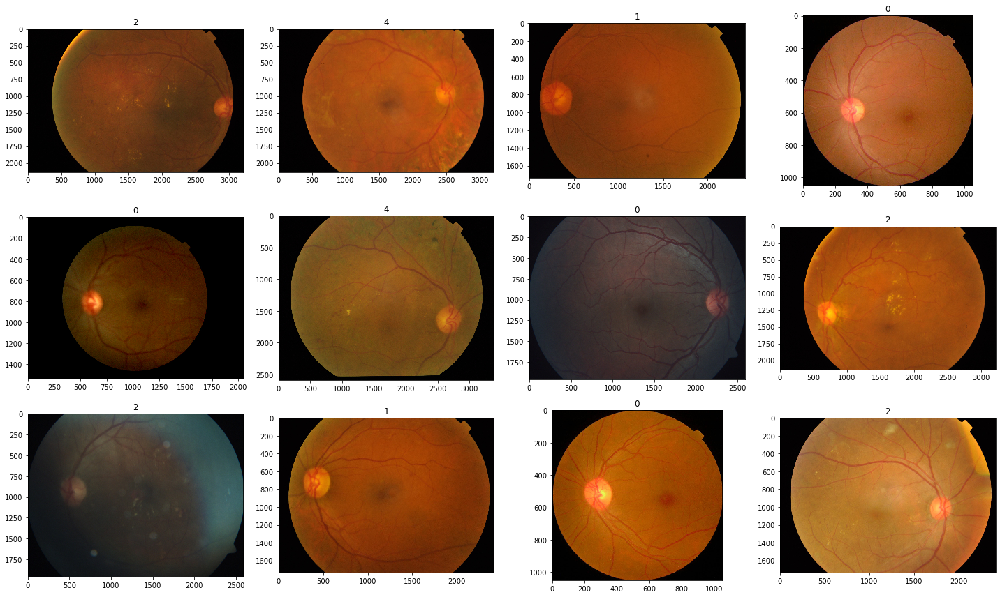

In [4]:
def display_samples(df, columns=4, rows=3):
    fig=plt.figure(figsize=(5*columns, 4*rows))

    for i in range(columns*rows):
        image_path = df.loc[i,'id_code']
        image_id = df.loc[i,'diagnosis']
        img = cv2.imread(f'../../raw_data/train_images/{image_path}.png')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        fig.add_subplot(rows, columns, i+1)
        plt.title(image_id)
        plt.imshow(img)
    
    plt.tight_layout()

display_samples(df_train)

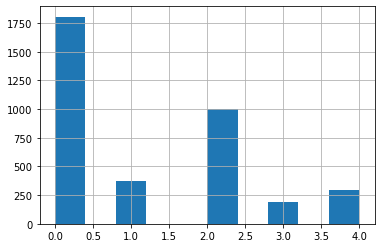

In [5]:
x = df_train['id_code']
y = df_train['diagnosis']

#x, y = shuffle(x, y, random_state=8) => import string_utils (import string_utils)
y.hist()

In [6]:
#target à 5 catégories
df_train.diagnosis.value_counts()

0    1805
2     999
1     370
4     295
3     193
Name: diagnosis, dtype: int64

In [7]:
df_train.head(5)

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [8]:
x.head()

0    000c1434d8d7
1    001639a390f0
2    0024cdab0c1e
3    002c21358ce6
4    005b95c28852
Name: id_code, dtype: object

In [9]:
y.head()

0    2
1    4
2    1
3    0
4    0
Name: diagnosis, dtype: int64

In [10]:
y = to_categorical(y, num_classes=NUM_CLASSES)
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15,
                                                      stratify=y, random_state=8)
print(train_x.shape)
print(train_y.shape)
print(valid_x.shape)
print(valid_y.shape)

(3112,)
(3112, 5)
(550,)
(550, 5)


We know the result will be a feature map with 224x224x64. We can plot all 64 two-dimensional images as an 8×8 square of images.



Tying all of this together, the complete code example of visualizing the feature map for the first convolutional layer in the VGG16 model for a bird input image is listed below.

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
Total params: 1,792
Trainable params: 1,792
Non-trainable params: 0
_________________________________________________________________


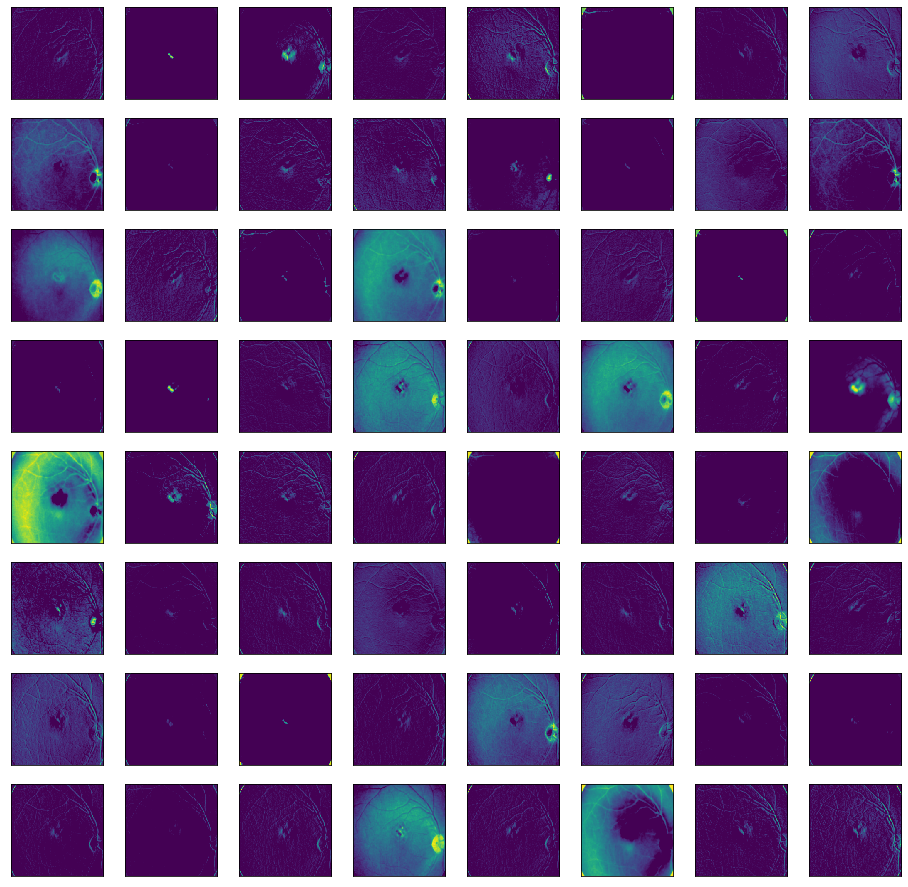

In [11]:
# plot feature map of first conv layer for given image
    #from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import VGG16
    #from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import preprocess_input
    #from keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import load_img
    #from keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import img_to_array
    #from keras.models import Model
from tensorflow.keras.models import Model
from matplotlib import pyplot 
from numpy import expand_dims


f = plt.figure(figsize=(16,16))
# load the modelf = plt.figure(figsize=(10,3))
model = VGG16()
# redefine model to output right after the first hidden layer
model = Model(inputs=model.inputs, outputs=model.layers[1].output)
model.summary()
# load the image with the required shape
img = load_img(f'../../raw_data/test_images/270a532df702.png', target_size=(224, 224))
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
for _ in range(square):
	for _ in range(square):
		# specify subplot and turn of axis
		ax = pyplot.subplot(square, square, ix)
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		pyplot.imshow(feature_maps[0, :, :, ix-1], cmap='viridis')
		ix += 1
# show the figure
pyplot.show()

This is an interesting result and generally matches our expectation. We could update the example to plot the feature maps from the output of other specific convolutional layers.

Another approach would be to collect feature maps output from each block of the model in a single pass, then create an image of each.

There are five main blocks in the image (e.g. block1, block2, etc.) that end in a pooling layer. The layer indexes of the last convolutional layer in each block are [2, 5, 9, 13, 17].

We can define a new model that has multiple outputs, one feature map output for each of the last convolutional layer in each block; for example:

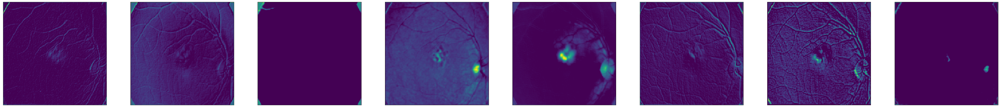

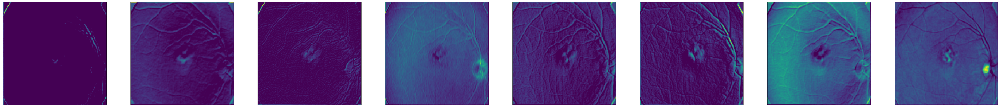

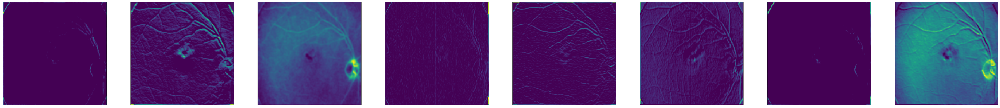

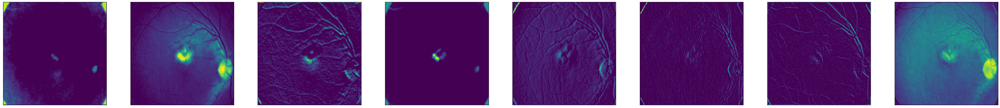

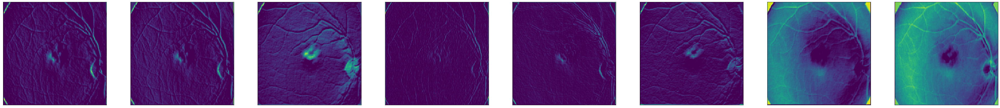

...

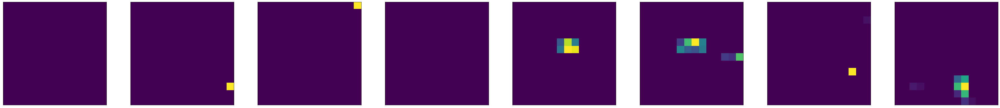

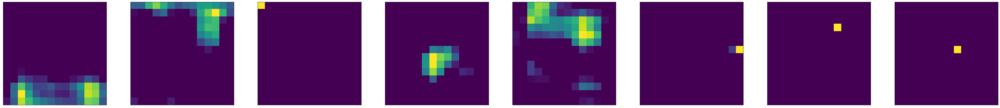

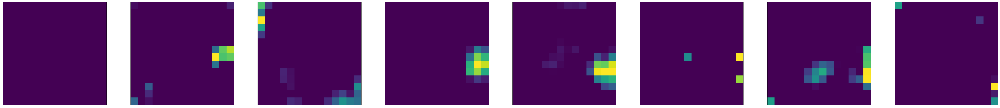

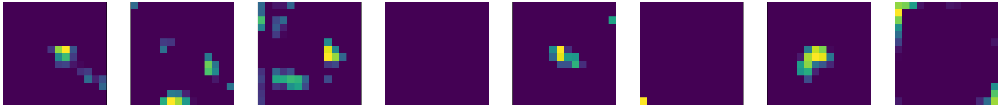

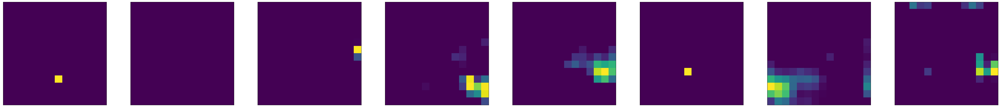

In [12]:
# visualize feature maps output from each block in the vgg model
#from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg16 import VGG16
#from keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import preprocess_input
#from keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import load_img
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import img_to_array
#from keras.models import Model
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from numpy import expand_dims




# load the model
model = VGG16()
# redefine model to output right after the first hidden layer
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
# convert the image to an array
img = load_img(f'../../raw_data/test_images/270a532df702.png', target_size=(224, 224))
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8
for fmap in feature_maps:
	# plot all 64 maps in an 8x8 squares
	ix = 1
	for _ in range(square):
		plt.figure(figsize=(64,64))
		for _ in range(square):
           

			# specify subplot and turn of axis
			ax = pyplot.subplot(square, square, ix)
			ax.set_xticks([])
			ax.set_yticks([])
			
			# plot filter channel in grayscale
			plt.imshow(fmap[0, :, :, ix-1], cmap='viridis')
			ix += 1
	# show the figure

        
	plt.show()

Running the example results in five plots showing the feature maps from the five main blocks of the VGG16 model.

We can see that the feature maps closer to the input of the model capture a lot of fine detail in the image and that as we progress deeper into the model, the feature maps show less and less detail.

This pattern was to be expected, as the model abstracts the features from the image into more general concepts that can be used to make a classification. Although it is not clear from the final image that the model saw a bird, we generally lose the ability to interpret these deeper feature maps.